#### Look into understaffing vs overstaffing; satisfied vs dissatisfied

In [1]:
import os
import sys
from pathlib import Path
base_dir = str(Path(Path.cwd()).resolve().parent.parent)
print(base_dir)
sys.path.append(base_dir)
import json

B:\data_science_projects\erdos_institute\aware-nlp


In [2]:
from src.retriever import load_retriever
from src.retriever import Retriever

c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
with open('../../data/BestBuyWorkers.json', 'r') as f:
    workers = json.load(f)

def format_reddit_entry(entry: dict) -> str:
    title = entry['reddit_title'].strip() if entry['reddit_title'] else ''
    text = entry['reddit_text'].strip() if entry['reddit_text'] else ''
    text = text.replace('\n', ' ')
    if len(title)>0:
        if len(text)>0:
            return title+'; '+text
        return title
    else:
        if len(text)>0:
            return text
    return None
sentences = [format_reddit_entry(worker) for worker in workers]
# clean out the None entries
sentences = [sentence for sentence in sentences if sentence]

In [4]:
import pandas as pd
df = pd.DataFrame(workers)
df['statement'] = sentences
columns = [
    'aware_created_ts', 'reddit_id', 'reddit_name',
    'reddit_created_utc', 'reddit_author', 
       'reddit_permalink', 'reddit_url', 'reddit_subreddit',
       'reddit_link_id', 'reddit_parent_id', 'reddit_submission', 'statement'
]
keep_cols = ['statement', 'question', 'label_sum', 'average_label',
       'consensus', 'reddit_id', 'aware_post_type', 'aware_created_ts',
       'reddit_link_id', 'reddit_parent_id', 'reddit_permalink',
       'reddit_subreddit'
]
df

,aware_post_type,aware_created_ts,reddit_id,reddit_name,reddit_created_utc,reddit_author,reddit_text,reddit_permalink,reddit_title,reddit_url,reddit_subreddit,reddit_link_id,reddit_parent_id,reddit_submission,statement
0,submission,2023-04-16T17:32:45,12opsul,t3_12opsul,1681680765,utaustinresearch,,/r/BestBuyWorkers/comments/12opsul/research_st...,Research Study Recruitment - Managers,https://i.redd.it/nrmkf51rebua1.png,BestBuyWorkers,None,None,None,Research Study Recruitment - Managers
1,comment,2023-04-16T18:48:06,jgjgy9e,t1_jgjgy9e,1681685286,Not_A_Real_Boy69,![gif](giphy|YmQLj2KxaNz58g7Ofg)\n\n$50?,/r/BestBuyWorkers/comments/12opsul/research_st...,None,None,BestBuyWorkers,t3_12opsul,t3_12opsul,12opsul,![gif](giphy|YmQLj2KxaNz58g7Ofg) $50?
2,comment,2023-04-16T19:55:39,jgjpqmp,t1_jgjpqmp,1681689339,GSAgentsLivesMatter,bullshit on getting $50 its just a coupon to B...,/r/BestBuyWorkers/comments/12opsul/research_st...,None,None,BestBuyWorkers,t3_12opsul,t3_12opsul,12opsul,bullshit on getting $50 its just a coupon to B...
3,submission,2023-04-14T11:18:57,12m0ozl,t3_12m0ozl,1681485537,None,Good luck y’all,/r/BestBuyWorkers/comments/12m0ozl/sr_role_eli...,Sr role eliminated,https://www.reddit.com/r/BestBuyWorkers/commen...,BestBuyWorkers,None,None,None,Sr role eliminated; Good luck y’all
4,comment,2023-04-14T14:52:47,jg9its6,t1_jg9its6,1681498367,JiminyWillikerz,I was there almost 5 years before my position ...,/r/BestBuyWorkers/comments/12m0ozl/sr_role_eli...,None,None,BestBuyWorkers,t3_12m0ozl,t3_12m0ozl,12m0ozl,I was there almost 5 years before my position ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5624,comment,2024-03-07T16:11:30,kttl60a,t1_kttl60a,1709845890,Dquinones97,You do realize you’re asking for a bonus while...,/r/BestBuyWorkers/comments/1b91wdi/sti_bonus/k...,None,None,BestBuyWorkers,t3_1b91wdi,t3_1b91wdi,1b91wdi,You do realize you’re asking for a bonus while...
5625,comment,2024-03-07T16:18:42,kttmfik,t1_kttmfik,1709846322,Lucky-Beautiful6993,HERE YOUR BONUS🥒,/r/BestBuyWorkers/comments/1b91wdi/sti_bonus/k...,None,None,BestBuyWorkers,t3_1b91wdi,t3_1b91wdi,1b91wdi,HERE YOUR BONUS🥒
5626,comment,2024-03-07T15:59:47,kttj3mt,t1_kttj3mt,1709845187,Retro_Sphynx,What has leadership done to deserve a bonus?,/r/BestBuyWorkers/comments/1b91wdi/sti_bonus/k...,None,None,BestBuyWorkers,t3_1b91wdi,t3_1b91wdi,1b91wdi,What has leadership done to deserve a bonus?
5627,comment,2024-03-07T14:20:49,ktt37u3,t1_ktt37u3,1709839249,One-Negotiation7444,Board meeting finished this week. It’s always...,/r/BestBuyWorkers/comments/1b91wdi/sti_bonus/k...,None,None,BestBuyWorkers,t3_1b91wdi,t3_1b91wdi,1b91wdi,Board meeting finished this week. It’s always...


In [5]:
from langchain_community.document_loaders import DataFrameLoader

keep_cols = ['statement', 'reddit_id', 'aware_post_type', 'aware_created_ts',
       'reddit_link_id', 'reddit_parent_id', 'reddit_permalink',
       'reddit_subreddit'
]
loader = DataFrameLoader(df[keep_cols], page_content_column='statement')
docs = loader.load()

In [6]:
from src.retriever import CustomRetriever

In [7]:
retriever = CustomRetriever(docs, 'all-mpnet-base-v1', 'cosine-similarity')

In [8]:
retriever._initialize_embedding_model()
retriever._initialize_splitter()
retriever.split_documents()


In [9]:
import numpy as np
embeddings = np.load('all-mpnet-base-v1-chunks-embedded.npz.npy')

In [10]:
#retriever.make_embeddings()
retriever.embeddings = list(embeddings)

In [11]:
#np.save('all-mpnet-base-v1-chunks-embedded.npz', np.array(retriever.embeddings))

In [12]:
question_positive = 'Are employees satisfied working at Best Buy?'
question_negative = 'Are employees unhappy working at Best Buy?'
pos_results = retriever.retrieve(question_positive, n=200)
neg_results = retriever.retrieve(question_negative, n=200)

c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\sentence_transformers\util.py:41: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:264.)
  b = torch.tensor(b)


In [13]:
pos_docs = [res['document'] for res in pos_results]
neg_docs = [res['document'] for res in neg_results]

In [14]:

doc_union = neg_docs.copy()
doc_union += [doc for doc in pos_docs if doc.page_content not in [doc.page_content for doc in neg_docs]]
random_indices = np.random.choice(len(retriever.documents), 200, replace=False).astype(int)
random_docs = np.array(retriever.documents)[random_indices].tolist()
print(len(doc_union))
total_docs = doc_union + [doc for doc in random_docs if doc.page_content not in [doc.page_content for doc in doc_union]]
total_docs = total_docs[:300] # keep 300


239


In [23]:
total_docs_inds = [retriever.documents.index(doc) for doc in total_docs]
print(total_docs_inds)

[2598, 686, 1082, 4, 1062, 2965, 1081, 257, 474, 34, 3112, 2916, 2268, 1113, 2909, 1035, 3110, 1056, 2979, 2239, 3103, 2019, 1162, 32, 222, 849, 2488, 4849, 323, 2803, 3349, 3340, 831, 2841, 5116, 3867, 2837, 3415, 94, 4079, 835, 2490, 4276, 5465, 4345, 4629, 817, 4851, 3111, 2424, 3293, 3673, 1378, 1392, 1401, 2478, 2905, 3291, 666, 892, 762, 4180, 2474, 419, 313, 2181, 1731, 2557, 3670, 685, 5238, 1712, 4848, 4459, 3062, 3677, 1130, 4194, 1387, 349, 945, 5459, 3033, 2780, 2230, 4610, 1727, 4759, 814, 1789, 1404, 3936, 4855, 4461, 943, 3719, 2482, 1619, 4207, 1158, 4012, 4867, 1416, 2233, 53, 5205, 1732, 940, 1318, 672, 4198, 1202, 3395, 3821, 3327, 243, 3196, 5439, 2902, 4126, 4639, 404, 93, 1033, 5203, 2471, 2608, 3113, 2915, 4605, 4155, 374, 5151, 203, 5458, 1877, 1333, 3860, 255, 2957, 4825, 4578, 415, 1399, 4615, 5475, 4531, 946, 4137, 3060, 3289, 4826, 3261, 1865, 504, 5200, 4125, 4584, 2468, 4445, 913, 4172, 651, 29, 3815, 3774, 1089, 2479, 2626, 4128, 3471, 5532, 1156, 3610, 3

In [31]:
output_df = pd.DataFrame(outputs)
output_df['statement'] = [doc.page_content for doc in total_docs]
output_df['chunk_id'] = total_docs_inds
output_df['question'] = 'Does this statement reflect sentiment about Best Buy? Label the sentiment as positive (1), negative (-1), or neutral/irrelevant (0).'
output_df.to_csv('../../data/best_buy/labeling/workers_happy_unhappy_labeled.csv', index=False)

In [34]:
random_indices_extra = np.random.choice(len(retriever.documents), 400, replace=False).astype(int)
random_indices_extra = [ind for ind in random_indices_extra if ind not in total_docs_inds]
print(len(random_indices_extra))
extra_docs = np.array(retriever.documents)[random_indices_extra].tolist()

386


In [15]:
selected_doc_embeddings = []
for doc in total_docs:
    for idx, ret_doc in enumerate(retriever.documents):
        if doc.page_content == ret_doc.page_content:
            selected_doc_embeddings.append(retriever.embeddings[idx])
            break

In [16]:
statements = [doc.page_content for doc in total_docs]

In [35]:
extra_statements = [doc.page_content for doc in extra_docs]

In [53]:
all_inds = np.arange(len(retriever.documents))
unlabeled_inds = set(all_inds) - set(total_docs_inds) - set(random_indices_extra)
unlabeled_inds = list(unlabeled_inds)
print(len(unlabeled_inds))
print(unlabeled_inds)

4981
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 30, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 88, 89, 90, 91, 92, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 120, 121, 123, 124, 125, 126, 127, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 171, 172, 173, 175, 176, 177, 178, 179, 181, 182, 183, 184, 185, 187, 188, 189, 190, 191, 194, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 229, 231, 232, 233, 234, 235, 236, 238, 240, 241, 242, 244, 245, 247, 248, 250, 252, 253, 254, 256

In [55]:
unlabeled_df = pd.DataFrame({'statement': [retriever.documents[ind].page_content for ind in unlabeled_inds]})
unlabeled_df['chunk_id'] = unlabeled_inds
unlabeled_df['question'] = 'Does this statement reflect sentiment about Best Buy? Label the sentiment as positive (1), negative (-1), or neutral/irrelevant (0).'
unlabeled_df['label'] = None
unlabeled_df.to_csv('../../data/best_buy/labeling/workers_happy_unhappy_unlabeled.csv', index=False)

In [57]:
pd.concat((output_df, unlabeled_df)).to_csv('../../data/best_buy/labeling/workers_happy_unhappy_all.csv', index=False)

In [56]:
df0 = pd.DataFrame(outputs)
df0['statement'] = [doc.page_content for doc in total_docs]
df0['chunk_id'] = total_docs_inds
df1 = pd.DataFrame(outputs1)
df1['statement'] = [doc.page_content for doc in extra_docs]
df1['chunk_id'] = random_indices_extra
output_df = pd.concat((df0, df1), axis=0)
output_df['question'] = 'Does this statement reflect sentiment about Best Buy? Label the sentiment as positive (1), negative (-1), or neutral/irrelevant (0).'
output_df.drop(columns=['output']).to_csv('../../data/best_buy/labeling/workers_happy_unhappy_labeled.csv', index=False)

PermissionError: [Errno 13] Permission denied: '../../data/best_buy/labeling/workers_happy_unhappy_labeled.csv'

In [48]:
df_extra = pd.DataFrame(outputs1)
df_extra

,label,reason,output,statement
0,-1,The statement suggests dissatisfaction as the ...,"{\n ""label"": -1,\n ""reason"": ""The statement...",No. That’s fraud . Also think that if you boos...
1,-1,"The statement provided is an emoji of a skull,...","{\n ""label"": -1,\n ""reason"": ""The state...",💀
2,0,The statement 'You ask. Always ask' is unclear...,"{\n ""label"": 0,\n ""reason"": ""The statement ...",You ask. Always ask
3,0,The statement 'Legally yes' does not provide a...,"{\n ""label"": 0,\n ""reason"": ""The statement ...",Legally yes
4,0,The statement does not indicate whether the em...,"{\n ""label"": 0,\n ""reason"": ""The statement ...",Employee Discount; I just started working last...
...,...,...,...,...
381,-1,The statement indicates dissatisfaction with t...,"{\n ""label"": -1,\n ""reason"": ""The state...","To be fair, it's been like that since I starte..."
382,1,"The statement shows gratitude and surprise, in...","{\n ""label"": 1,\n ""reason"": ""The statement ...",Omg thank you. I didn't know that was possible...
383,0,The statement provided is a correction of a gr...,"{\n ""label"": 0,\n ""reason"": ""The statement ...","/u/squishey123, I have found an error in your ..."
384,-1,"The statement seems to be a joke or sarcasm, b...","{\n ""label"": -1,\n ""reason"": ""The statement...","Let’s put it this way, don’t waste the deterge..."


In [17]:
from src.labeler.ollama import OllamaLabelerVariablePrompt, PromptTemplate
from langchain_community.llms import Ollama
prompt_text = """<s>[INST] <<SYS>>
            The following statement (delimited by ```) provided below is a response from an employee at the company of interest. 
            The statement should be taken as is. It cannot be used to further a dialogue with the employee. 
            Your task is to determine whether the statement says that the employee is satisfied (1), unsatisfied (-1), or neither (0)
            working at Best Buy.
            
            Please format the output as a dictionary with the following keys: "label", "reason". 
            label should be an integer value indicating whether the statement described satisfied (1), 
            unsatisfied (-1), or irrelevant (0).
            Reason should be a string explaining the rationale behind the label.
            <</SYS>>
            ```
            Statement: {statement}
            ```
            {question}
            [/INST]"""
llm = Ollama(model = 'dolphin-mixtral', temperature=0.01)
prompt = PromptTemplate(template=prompt_text, input_variables=["statement", "question"])
labeler = OllamaLabelerVariablePrompt(llm, prompt)

In [18]:
from typing import Dict, Any

def wrap_text(text, n_words: int = 15, indent: str = ''):
    sent = text.split(' ')
    for i in range(n_words, len(sent), n_words):
        sent.insert(i, '\n'+indent)
    return ' '.join(sent)

def print_labeler_iteration(statement: str, out: Dict[str, Any]):
    statement = wrap_text(statement, n_words = 20,indent="\t")
    print(f'\n{"--"*30}\n')
    print(f'Statement: {statement}')

    rel = out.get('relevant')
    reason = wrap_text(out.get('reason'), n_words = 20, indent = '\t\t')
    raw_output = wrap_text(out.get('output'), n_words = 20, indent='\t')

    print_statement = 'Output: '
    print_statement += f'{raw_output}' if rel is None else f'\n\tRelevant: {rel}\n\tReason: {reason}'
    print(print_statement)

In [40]:
extra_statements[0]

'No. That’s fraud . Also think that if you boost your numbers . They’re going to expect you to better those numbers in the future . Develop good habits and offer solutions and the numbers will get better with time .'

In [43]:
prompt_text = """<s>[INST] <<SYS>>
            The following statement (delimited by ```) provided below is a response from an employee at the company of interest. 
            The statement should be taken as is. It cannot be used to further a dialogue with the employee. 
            Your task is to determine whether the statement explicitly says that the employee is satisfied (1), 
            unsatisfied (-1), or neither (0) working at Best Buy. This should be an assessment of the opinion of the author 
            of the statement. If the statement is neutral or irrelevant, please label it as 0.
            
            Please format the output as a dictionary with the following keys: "label", "reason". 
            label should be an integer value indicating whether the statement explicitly stated that the employee was satisfied (1), 
            unsatisfied (-1), or irrelevant/neutral (0).
            Reason should be a string explaining the rationale behind the label.
            <</SYS>>
            ```
            Statement: {statement}
            ```
            {question}
            [/INST]"""
llm = Ollama(model = 'dolphin-mixtral', temperature=0.01)
prompt = PromptTemplate(template=prompt_text, input_variables=["statement", "question"])

In [44]:
import time
from datetime import timedelta

outputs1 = []
num_docs = len(extra_docs)
for idx, doc in enumerate(extra_docs):
    t0 = time.time()
    output = labeler.evaluate_one('', extra_statements[idx])
    outputs1.append(output | {'statement': extra_statements[idx]})
    print_labeler_iteration(extra_statements[idx], output)
    pd.DataFrame(outputs1).to_csv('../../data/best_buy/labeling/satisfied-unsatisfied-labels-extras.csv', index=False)
    t1 = time.time()
    print(f'... done with {idx+1}/{num_docs}; took {timedelta(seconds=(t1-t0))}')


------------------------------------------------------------

Statement: No. That’s fraud . Also think that if you boost your numbers . They’re going to expect you to better 
	 those numbers in the future . Develop good habits and offer solutions and the numbers will get better with 
	 time .
Output:  {
  "label": -1,
  "reason": "The statement suggests dissatisfaction as the employee is referring to fraud and expressing 
	 concerns about meeting expectations in the future."
}
... done with 1/386; took 0:00:43.860926

------------------------------------------------------------

Statement: 💀
Output:  {
    "label": -1,
    "reason": "The statement provided is an emoji of a skull, 
	 which typically represents death or danger. This suggests that the employee may be feeling unsatisfied with their job at 
	 Best Buy."
}
... done with 2/386; took 0:00:55.081021

------------------------------------------------------------

Statement: You ask. Always ask
Output:  {
  "label": 0,
  "reason"

In [46]:
outputs1

[{'label': -1,
  'reason': 'The statement suggests dissatisfaction as the employee is referring to fraud and expressing concerns about meeting expectations in the future.',
  'output': ' {\n  "label": -1,\n  "reason": "The statement suggests dissatisfaction as the employee is referring to fraud and expressing concerns about meeting expectations in the future."\n}',
  'statement': 'No. That’s fraud . Also think that if you boost your numbers . They’re going to expect you to better those numbers in the future . Develop good habits and offer solutions and the numbers will get better with time .'},
 {'label': -1,
  'reason': 'The statement provided is an emoji of a skull, which typically represents death or danger. This suggests that the employee may be feeling unsatisfied with their job at Best Buy.',
  'output': ' {\n    "label": -1,\n    "reason": "The statement provided is an emoji of a skull, which typically represents death or danger. This suggests that the employee may be feeling un

In [45]:
df1 = pd.DataFrame(outputs1)
df1.label.value_counts()

label
-1    247
 0    117
 1     22
Name: count, dtype: int64

In [19]:
import time
from datetime import timedelta

outputs = []
num_docs = len(total_docs)
for idx, doc in enumerate(total_docs):
    t0 = time.time()
    output = labeler.evaluate_one('', statements[idx])
    outputs.append(output)
    print_labeler_iteration(statements[idx], output)
    pd.DataFrame(outputs).to_csv('../../data/best_buy/labeling/satisfied-unsatisfied-labels.csv', index=False)
    t1 = time.time()
    print(f'... done with {idx+1}/{num_docs}; took {timedelta(seconds=(t1-t0))}')


------------------------------------------------------------

Statement: Quit, find a new job. Best Buy is terrible
Output:  {
  "label": -1,
  "reason": "The statement 'Quit, find a new job. Best Buy is terrible' suggests that 
	 the employee is unsatisfied with their current job at Best Buy."
}
... done with 1/300; took 0:02:16.369595

------------------------------------------------------------

Statement: Best Buy used to be a great company to work for before Corie the CEO took over. Employees used to 
	 love working there, staffing was great, it wasn’t all about stupid sales metrics. Times have changed
Output:  {
  "label": -1,
  "reason": "The statement indicates that the employee is unsatisfied with their current work environment 
	 at Best Buy since they mentioned that things were better before the CEO took over and criticized the focus 
	 on sales metrics."
}
... done with 2/300; took 0:01:08.376561

------------------------------------------------------------

Statement: all

In [20]:
output_df = pd.DataFrame(outputs)

In [22]:
output_df.label.value_counts()

label
-1    225
 0     45
 1     30
Name: count, dtype: int64

In [88]:
idx= 0 
input_str = 'Label the following statement as describing overstaffing (1), understaffing (-1), or neither (0)'
input_str += '\nStatement:', wrap_text(statements[idx], n_words = 15, indent='\t'

Label the following statement as describing overstaffing (1), understaffing (-1), or neither (0)
Statement: Absolutely. I had a talk with a leader last week about this, pointing out that 
	 we're running a bare minimum of staff who have to know and do more 
	 than ever before while being paid less than we were just two years ago.


In [99]:
labels = []

for idx, (statement, output) in enumerate(zip(statements, outputs)):
    input_str = f'{idx+1}/{num_docs}: Label the following statement as describing satisfactory (1), unsatisfactory (-1), or neither (0)'
    input_str += f'\nLLM Label: {output["label"]}'
    input_str += '\nStatement: ' + wrap_text(statement, n_words = 15, indent='\t')
    label = int(input(input_str))
    labels.append(label)


ValueError: invalid literal for int() with base 10: '-'

In [103]:
idx0 = idx

for idx, (statement, output) in enumerate(zip(statements[idx0:], outputs[idx0:])):
    input_str = f'{idx+1}/{num_docs}: Label the following statement as describing overstaffing (1), understaffing (-1), or neither (0)'
    input_str += f'\nLLM Label: {output["label"]}'
    input_str += '\nStatement: ' + wrap_text(statement, n_words = 15, indent='\t')
    label = int(input(input_str))
    labels.append(label)

ValueError: invalid literal for int() with base 10: '-'

In [105]:
len(labels)

192

In [106]:
idx0 = len(labels)

for idx, (statement, output) in enumerate(zip(statements[idx0:], outputs[idx0:])):
    input_str = f'{idx0+idx+1}/{num_docs}: Label the following statement as describing overstaffing (1), understaffing (-1), or neither (0)'
    input_str += f'\nLLM Label: {output["label"]}'
    input_str += '\nStatement: ' + wrap_text(statement, n_words = 15, indent='\t')
    label = int(input(input_str))
    labels.append(label)

In [107]:
print(num_docs)
print(len(labels))

326
326


In [102]:
print(idx0)
print(len(labels))

83
83


In [114]:
output_df['human_labels'] = labels
output_df['statement'] = statements
output_df.to_csv('../../data/best_buy/labeling/overstaffed-understaffed-with-human.csv')

In [115]:
output_df.human_labels.value_counts()

human_labels
 0    276
-1     43
 1      7
Name: count, dtype: int64

In [111]:
from sklearn.metrics import accuracy_score, f1_score

In [113]:
accuracy_score(output_df['human_labels'], output_df['label'])

0.5705521472392638

In [116]:
# import isomap
from sklearn.manifold import Isomap
isomapper = Isomap()

In [126]:
selected_doc_embeddings[0].shape

(768,)

In [128]:
X = np.array(selected_doc_embeddings)
print(X.shape)

(326, 768)


In [129]:
# run isomap
X_transform = isomapper.fit_transform(X)

In [130]:
X_transform.shape

(326, 2)

In [138]:
retriever.__dict__.keys()

dict_keys(['documents', 'embedding_name', 'similarity_name', 'content_field', 'chunk_overlap', 'splitter', 'encoder', 'embeddings', 'name', 'metric'])

Text(0.5, 1.0, 'Iso Map Projection of embedding: all-mpnet-base-v1')

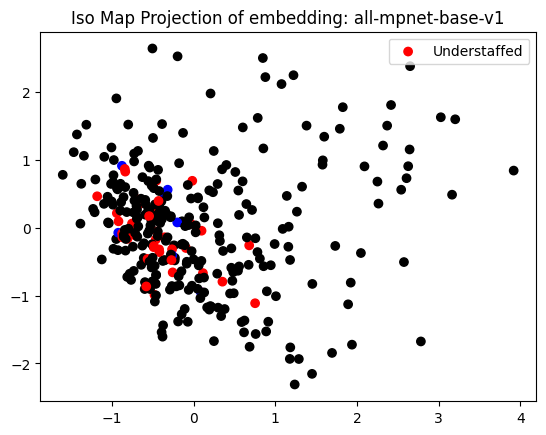

In [139]:
# Plot X_transform as a scatter plot with the human labels as the hue 
from matplotlib import pyplot as plt
color_dict = {
    -1 : 'red',
    0 : 'black',
    1 : 'blue'
}
colors = [color_dict[label] for label in labels]
plt.scatter(X_transform[:,0], X_transform[:,1], color = colors)
plt.legend(['Understaffed', 'Irrelevant', 'Overstaffed'])
plt.title(f'Iso Map Projection of embedding: {retriever.embedding_name}')

In [267]:
labels

[-1,
 -1,
 -1,
 -1,
 1,
 0,
 0,
 0,
 -1,
 -1,
 -1,
 -1,
 -1,
 0,
 0,
 -1,
 -1,
 -1,
 -1,
 0,
 0,
 0,
 -1,
 0,
 0,
 1,
 0,
 1,
 -1,
 0,
 0,
 -1,
 0,
 0,
 0,
 -1,
 0,
 0,
 -1,
 -1,
 -1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 -1,
 -1,
 0,
 -1,
 -1,
 -1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 -1,
 0,
 0,
 0,
 -1,
 -1,
 -1,
 -1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 -1,
 -1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 -1,
 0,
 0,
 -1,
 0,
 0,
 -1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 -1,
 -1,
 0,
 -1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 -1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 -1,
 0,
 0,
 0,
 0,
 -1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,

In [274]:
X_transform.shape

(326, 2)

In [281]:
label_filter = np.where(np.array(labels) == -1)
label_filter[0]

array([  0,   1,   2,   3,   8,   9,  10,  11,  12,  15,  16,  17,  18,
        22,  28,  31,  35,  38,  39,  40,  53,  54,  56,  57,  58,  66,
        70,  71,  72,  73,  81,  82, 107, 110, 113, 121, 122, 124, 183,
       205, 210, 308, 310], dtype=int64)

In [283]:
reduction.transform()

TypeError: LocallyLinearEmbedding.transform() missing 1 required positional argument: 'X'

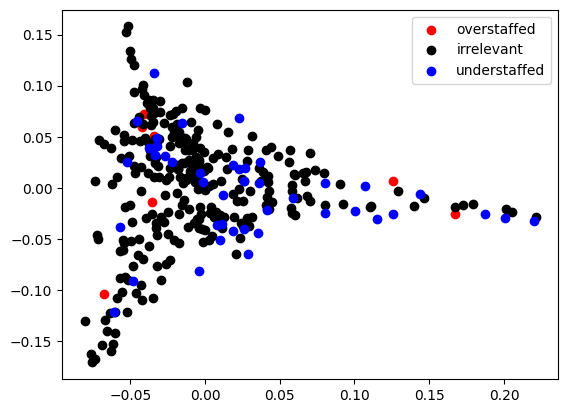

In [282]:
reduction = reductions['LLE']
X = np.array(selected_doc_embeddings)
reduction.fit(retriever.embeddings)
X_transform = reduction.fit_transform(X)
label_filter = np.where(np.array(labels) == 1)[0]
plt.scatter(X_transform[label_filter,0], X_transform[label_filter,1], color = 'r', label='overstaffed')
label_filter = np.where(np.array(labels) == 0)[0]
plt.scatter(X_transform[label_filter,0], X_transform[label_filter,1], color = 'k', label='irrelevant')
label_filter = np.where(np.array(labels) == -1)[0]
plt.scatter(X_transform[label_filter,0], X_transform[label_filter,1], color = 'b', label='understaffed')
plt.legend()

C:\Users\peter\AppData\Local\Temp\ipykernel_29108\3341655459.py:67: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


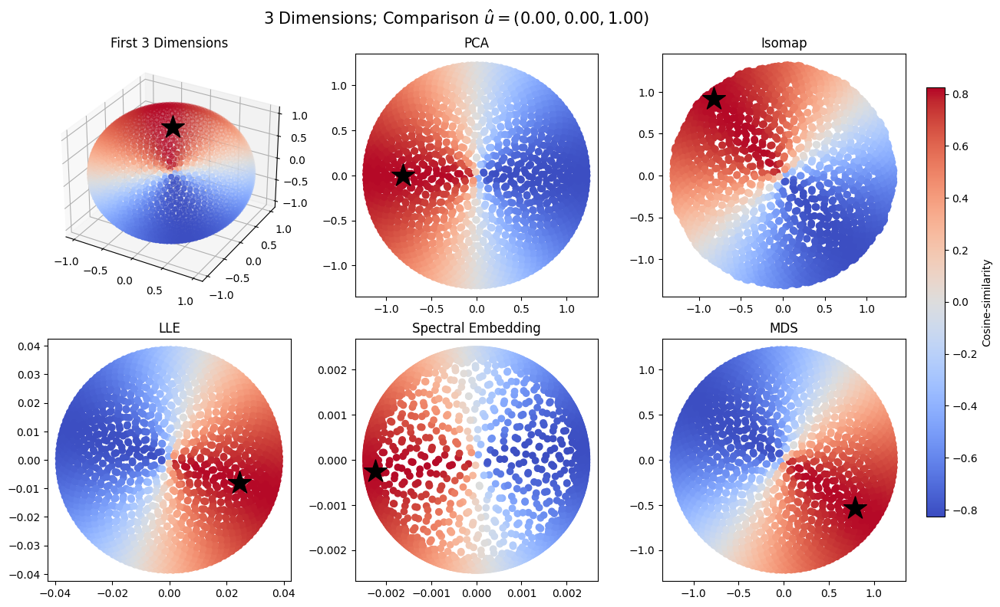

C:\Users\peter\AppData\Local\Temp\ipykernel_29108\3341655459.py:67: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


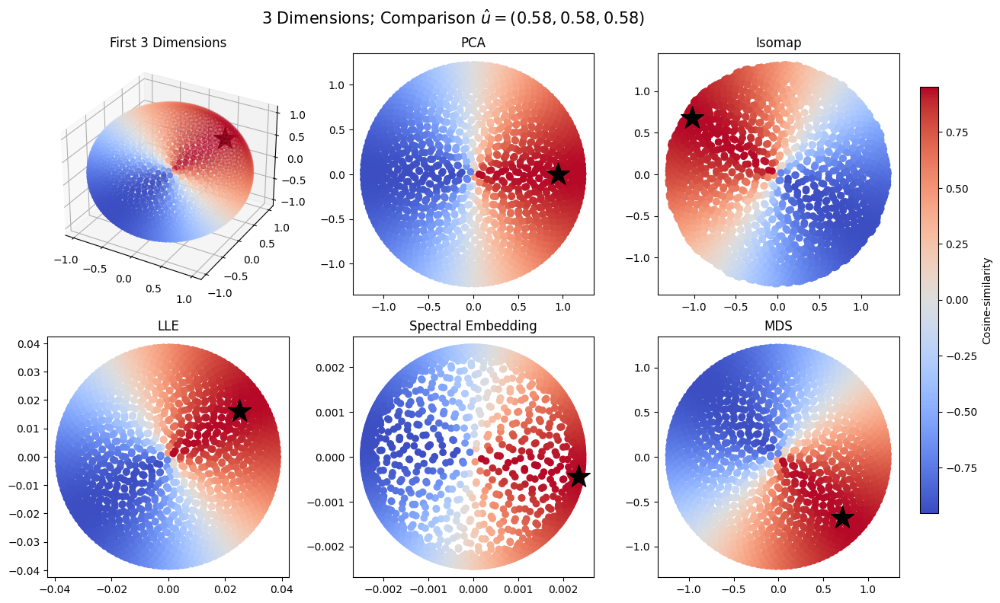

C:\Users\peter\AppData\Local\Temp\ipykernel_29108\3341655459.py:67: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


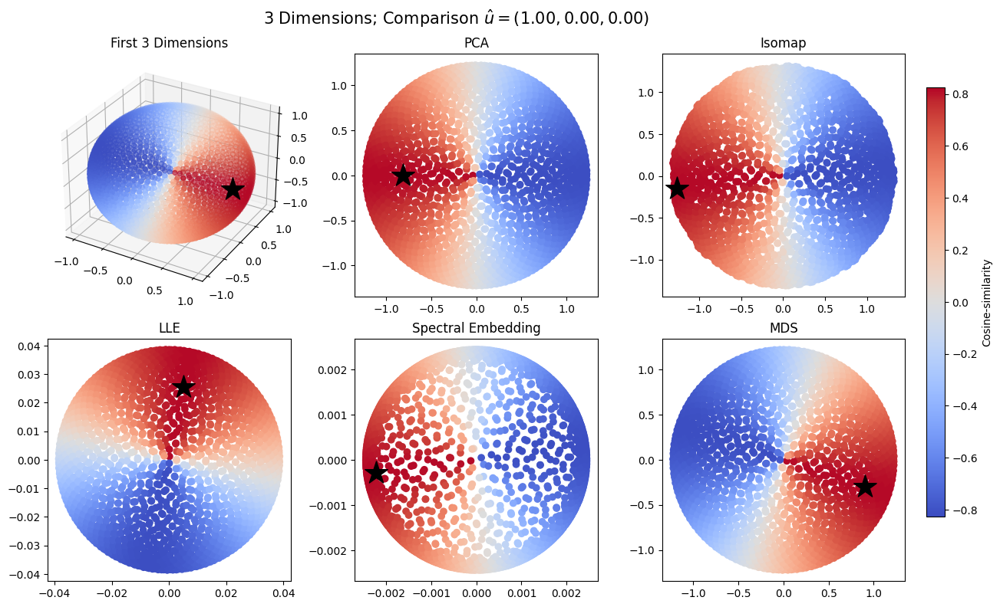

In [249]:
import numpy as np

def generate_equidistant_fibonacci_vectors_ndim(n, ndim):
    # Generate Fibonacci lattice points
    golden_ratio = (1 + np.sqrt(5)) / 2
    phi_values = 2 * np.pi * np.arange(n) / golden_ratio
    theta_values = np.arccos(1 - 2 * (np.arange(n) + 0.5) / n)

    # Convert spherical coordinates to Cartesian coordinates in n dimensions
    unit_vectors = []
    for i in range(n):
        coordinates = []
        for j in range(ndim):
            coord = np.cos(phi_values[i] + j * np.pi / ndim) * np.sin(theta_values[i])
            coordinates.append(coord)
        unit_vectors.append(coordinates)

    return np.array(unit_vectors)

# Example: Generate 1000 equidistant unit vectors in 5 dimensions
n_vectors = 2000
n_dimensions = 3
vectors = generate_equidistant_fibonacci_vectors_ndim(n_vectors, n_dimensions)

reductions = {
    'PCA': PCA(n_components=2),
    'Isomap': Isomap(n_components=2),
    'LLE': LocallyLinearEmbedding(n_components=2),
    'Spectral Embedding': SpectralEmbedding(n_components=2),
    'MDS': MDS(n_components=2, normalized_stress='auto')
}
us = []
u_temp = np.zeros(n_dimensions)
u_temp[-1] = 1
us.append(u_temp)
us.append(1./np.sqrt(n_dimensions)*np.ones(n_dimensions))
u_temp = np.zeros(n_dimensions)
u_temp[0] = 1
us.append(u_temp)
for u in us:
    dist = cosine_similarity(np.array(u).reshape(1,-1), vectors)
    min_dist = np.min(dist) - 0.01
    max_dist = np.max(dist) + 0.01
    
    # Create a figure with subplots
    fig = plt.figure(figsize=(12, 8))

    # Original 3D plot
    ax = fig.add_subplot(231, projection='3d')  # Render the first plot in 3D
    ax.scatter(vectors[:, 0], vectors[:, 1], vectors[:, 2], c=dist, cmap='coolwarm', vmin=min_dist, vmax=max_dist)
    ax.scatter(u[0], u[1], u[2], c='black', marker='*', s=500)
    ax.set_title('First 3 Dimensions')

    for i, (name, reducer) in enumerate(reductions.items()):
        reduced_vectors = reducer.fit_transform(np.vstack((vectors, u)))
        ax = fig.add_subplot(2, 3, i + 2)
        im = ax.scatter(reduced_vectors[:-1, 0], reduced_vectors[:-1, 1], c=dist, cmap='coolwarm', vmin=min_dist, vmax=max_dist)
        ax.scatter(reduced_vectors[-1, 0], reduced_vectors[-1, 1], marker='*', color='k', s=500)
        ax.set_title(f'{name}')
        ax.axis('square')
    title_str = f'{n_dimensions} Dimensions; Comparison $\\hat{{u}} = (' + ', '.join([f'{coord:.2f}' for coord in u]) + ')$'
    fig.suptitle(title_str, fontsize=15)
    # Add colorbar to the figure with title "Cosine-similarity" on the right
    cax = fig.add_axes([1.01, 0.15, 0.02, 0.7])  # Adjust the position of the colorbar
    fig.colorbar(im, cax=cax, label='Cosine-similarity')
    # Show the plots
    plt.tight_layout()
    plt.show()

C:\Users\peter\AppData\Local\Temp\ipykernel_29108\2829475633.py:67: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


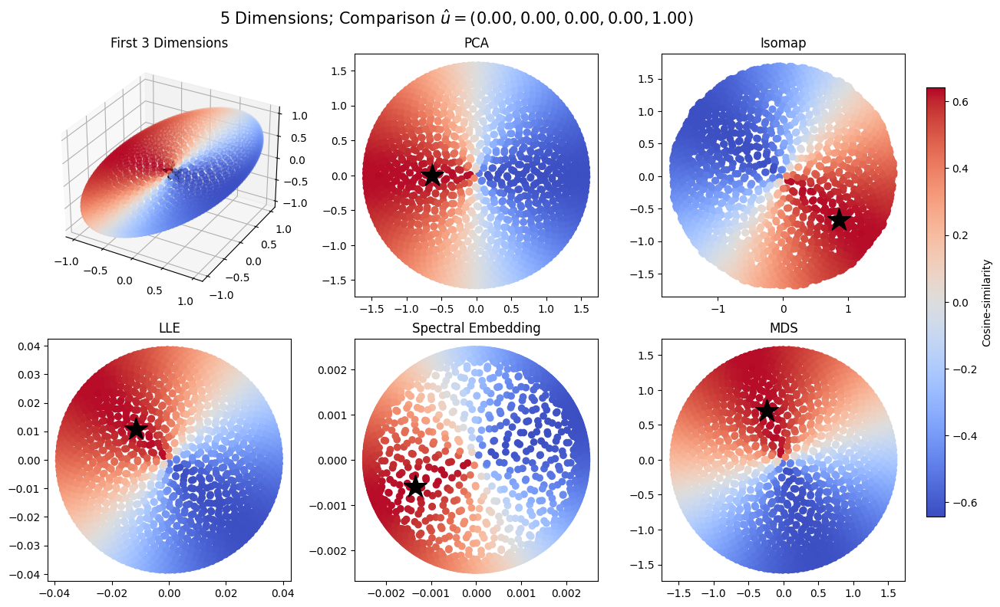

C:\Users\peter\AppData\Local\Temp\ipykernel_29108\2829475633.py:67: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


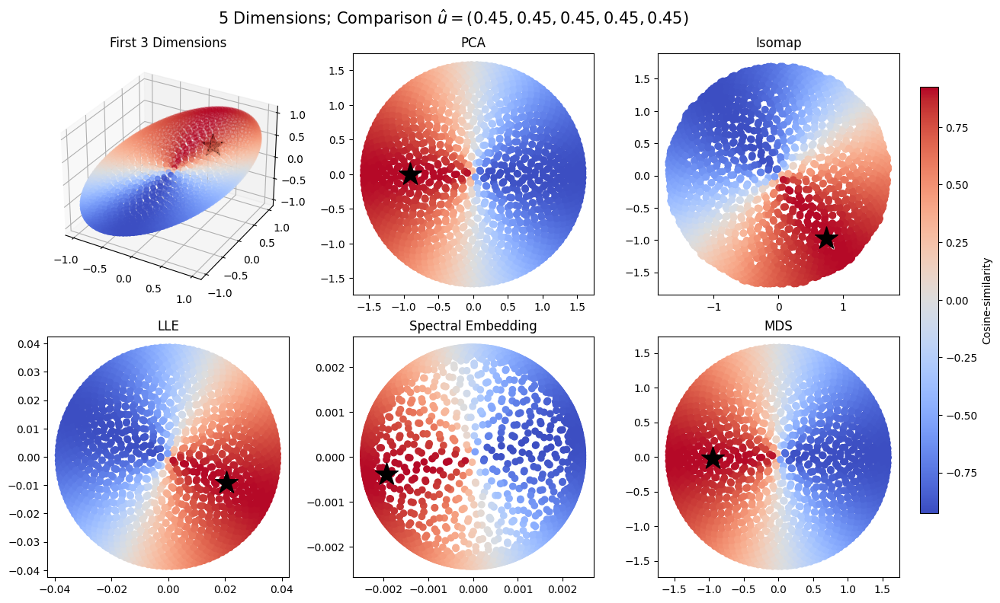

C:\Users\peter\AppData\Local\Temp\ipykernel_29108\2829475633.py:67: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


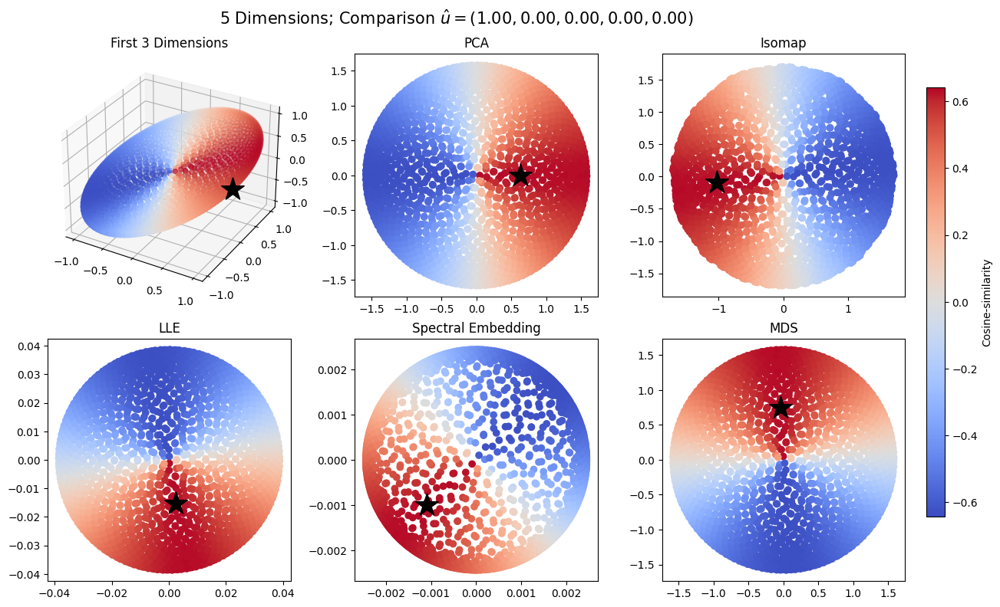

In [248]:
import numpy as np

def generate_equidistant_fibonacci_vectors_ndim(n, ndim):
    # Generate Fibonacci lattice points
    golden_ratio = (1 + np.sqrt(5)) / 2
    phi_values = 2 * np.pi * np.arange(n) / golden_ratio
    theta_values = np.arccos(1 - 2 * (np.arange(n) + 0.5) / n)

    # Convert spherical coordinates to Cartesian coordinates in n dimensions
    unit_vectors = []
    for i in range(n):
        coordinates = []
        for j in range(ndim):
            coord = np.cos(phi_values[i] + j * np.pi / ndim) * np.sin(theta_values[i])
            coordinates.append(coord)
        unit_vectors.append(coordinates)

    return np.array(unit_vectors)

# Example: Generate 1000 equidistant unit vectors in 5 dimensions
n_vectors = 2000
n_dimensions = 5
vectors = generate_equidistant_fibonacci_vectors_ndim(n_vectors, n_dimensions)

reductions = {
    'PCA': PCA(n_components=2),
    'Isomap': Isomap(n_components=2),
    'LLE': LocallyLinearEmbedding(n_components=2),
    'Spectral Embedding': SpectralEmbedding(n_components=2),
    'MDS': MDS(n_components=2, normalized_stress='auto')
}
us = []
u_temp = np.zeros(n_dimensions)
u_temp[-1] = 1
us.append(u_temp)
us.append(1./np.sqrt(n_dimensions)*np.ones(n_dimensions))
u_temp = np.zeros(n_dimensions)
u_temp[0] = 1
us.append(u_temp)
for u in us:
    dist = cosine_similarity(np.array(u).reshape(1,-1), vectors)
    min_dist = np.min(dist) - 0.01
    max_dist = np.max(dist) + 0.01
    
    # Create a figure with subplots
    fig = plt.figure(figsize=(12, 8))

    # Original 3D plot
    ax = fig.add_subplot(231, projection='3d')  # Render the first plot in 3D
    ax.scatter(vectors[:, 0], vectors[:, 1], vectors[:, 2], c=dist, cmap='coolwarm', vmin=min_dist, vmax=max_dist)
    ax.scatter(u[0], u[1], u[2], c='black', marker='*', s=500)
    ax.set_title('First 3 Dimensions')

    for i, (name, reducer) in enumerate(reductions.items()):
        reduced_vectors = reducer.fit_transform(np.vstack((vectors, u)))
        ax = fig.add_subplot(2, 3, i + 2)
        im = ax.scatter(reduced_vectors[:-1, 0], reduced_vectors[:-1, 1], c=dist, cmap='coolwarm', vmin=min_dist, vmax=max_dist)
        ax.scatter(reduced_vectors[-1, 0], reduced_vectors[-1, 1], marker='*', color='k', s=500)
        ax.set_title(f'{name}')
        ax.axis('square')
    title_str = f'{n_dimensions} Dimensions; Comparison $\\hat{{u}} = (' + ', '.join([f'{coord:.2f}' for coord in u]) + ')$'
    fig.suptitle(title_str, fontsize=15)
    # Add colorbar to the figure with title "Cosine-similarity" on the right
    cax = fig.add_axes([1.01, 0.15, 0.02, 0.7])  # Adjust the position of the colorbar
    fig.colorbar(im, cax=cax, label='Cosine-similarity')
    # Show the plots
    plt.tight_layout()
    plt.show()


C:\Users\peter\AppData\Local\Temp\ipykernel_29108\771923574.py:67: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


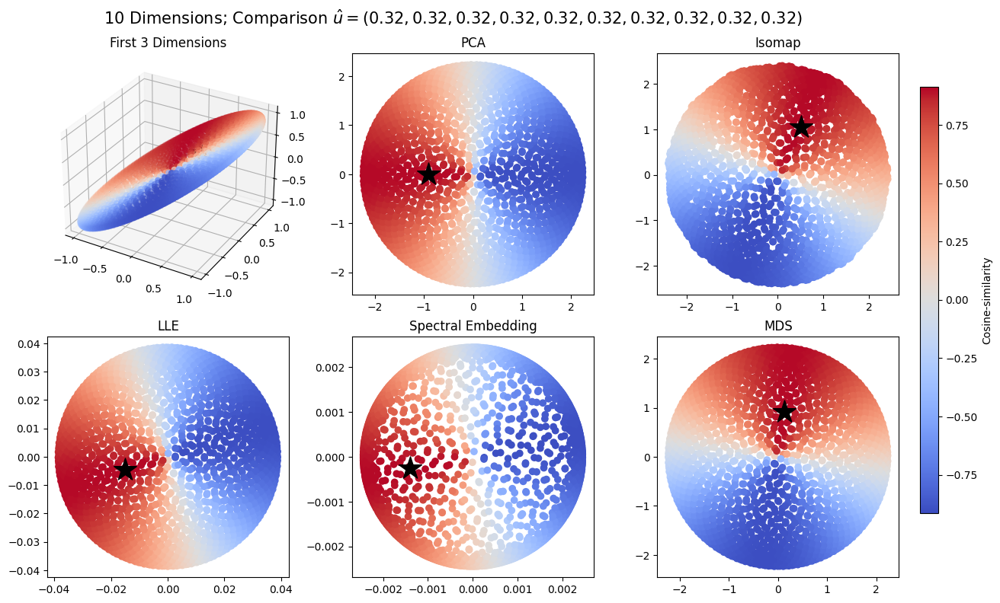

In [252]:
import numpy as np

def generate_equidistant_fibonacci_vectors_ndim(n, ndim):
    # Generate Fibonacci lattice points
    golden_ratio = (1 + np.sqrt(5)) / 2
    phi_values = 2 * np.pi * np.arange(n) / golden_ratio
    theta_values = np.arccos(1 - 2 * (np.arange(n) + 0.5) / n)

    # Convert spherical coordinates to Cartesian coordinates in n dimensions
    unit_vectors = []
    for i in range(n):
        coordinates = []
        for j in range(ndim):
            coord = np.cos(phi_values[i] + j * np.pi / ndim) * np.sin(theta_values[i])
            coordinates.append(coord)
        unit_vectors.append(coordinates)

    return np.array(unit_vectors)

# Example: Generate 1000 equidistant unit vectors in 5 dimensions
n_vectors = 2000
n_dimensions = 10
vectors = generate_equidistant_fibonacci_vectors_ndim(n_vectors, n_dimensions)

reductions = {
    'PCA': PCA(n_components=2),
    'Isomap': Isomap(n_components=2),
    'LLE': LocallyLinearEmbedding(n_components=2),
    'Spectral Embedding': SpectralEmbedding(n_components=2),
    'MDS': MDS(n_components=2, normalized_stress='auto')
}
us = []
u_temp = np.zeros(n_dimensions)
u_temp[-1] = 1
#us.append(u_temp)
us.append(1./np.sqrt(n_dimensions)*np.ones(n_dimensions))
u_temp = np.zeros(n_dimensions)
u_temp[0] = 1
#us.append(u_temp)
for u in us:
    dist = cosine_similarity(np.array(u).reshape(1,-1), vectors)
    min_dist = np.min(dist) - 0.01
    max_dist = np.max(dist) + 0.01
    
    # Create a figure with subplots
    fig = plt.figure(figsize=(12, 8))

    # Original 3D plot
    ax = fig.add_subplot(231, projection='3d')  # Render the first plot in 3D
    ax.scatter(vectors[:, 0], vectors[:, 1], vectors[:, 2], c=dist, cmap='coolwarm', vmin=min_dist, vmax=max_dist)
    ax.scatter(u[0], u[1], u[2], c='black', marker='*', s=500)
    ax.set_title('First 3 Dimensions')

    for i, (name, reducer) in enumerate(reductions.items()):
        reduced_vectors = reducer.fit_transform(np.vstack((vectors, u)))
        ax = fig.add_subplot(2, 3, i + 2)
        im = ax.scatter(reduced_vectors[:-1, 0], reduced_vectors[:-1, 1], c=dist, cmap='coolwarm', vmin=min_dist, vmax=max_dist)
        ax.scatter(reduced_vectors[-1, 0], reduced_vectors[-1, 1], marker='*', color='k', s=500)
        ax.set_title(f'{name}')
        ax.axis('square')
    title_str = f'{n_dimensions} Dimensions; Comparison $\\hat{{u}} = (' + ', '.join([f'{coord:.2f}' for coord in u]) + ')$'
    fig.suptitle(title_str, fontsize=15)
    # Add colorbar to the figure with title "Cosine-similarity" on the right
    cax = fig.add_axes([1.01, 0.15, 0.02, 0.7])  # Adjust the position of the colorbar
    fig.colorbar(im, cax=cax, label='Cosine-similarity')
    # Show the plots
    plt.tight_layout()
    plt.show()

In [254]:
vals

(array([0.     , 0.     , 0.     , 0.     , 1.65825, 2.079  , 1.287  ,
        1.01475, 0.891  , 0.792  , 0.71775, 0.6435 , 0.6435 , 0.61875,
        0.5445 , 0.51975, 0.51975, 0.495  , 0.495  , 0.47025, 0.4455 ,
        0.47025, 0.47025, 0.4455 , 0.396  , 0.42075, 0.396  , 0.42075,
        0.37125, 0.42075, 0.3465 , 0.4455 , 0.37125, 0.37125, 0.396  ,
        0.37125, 0.37125, 0.32175, 0.37125, 0.37125, 0.32175, 0.37125,
        0.3465 , 0.3465 , 0.396  , 0.3465 , 0.3465 , 0.3465 , 0.37125,
        0.3465 , 0.3465 , 0.3465 , 0.3465 , 0.3465 , 0.3465 , 0.37125,
        0.37125, 0.32175, 0.37125, 0.396  , 0.37125, 0.37125, 0.3465 ,
        0.396  , 0.37125, 0.3465 , 0.396  , 0.37125, 0.396  , 0.42075,
        0.37125, 0.4455 , 0.37125, 0.4455 , 0.42075, 0.4455 , 0.42075,
        0.4455 , 0.4455 , 0.47025, 0.47025, 0.51975, 0.5445 , 0.5445 ,
        0.56925, 0.56925, 0.61875, 0.66825, 0.7425 , 0.7425 , 0.9405 ,
        1.01475, 1.287  , 2.079  , 1.6335 , 0.     , 0.     , 0.     ,
      

In [265]:
print(np.shape(dist[0].tolist()))

(2000,)


<Axes: ylabel='Density'>

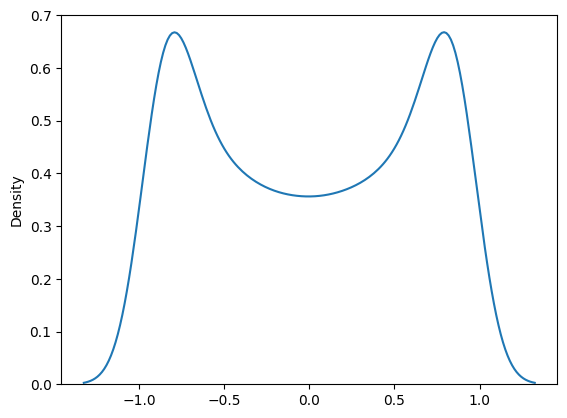

In [266]:
import seaborn as sns
# Make a histogram line plot from dist
sns.kdeplot(data = dist[0].tolist())

c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


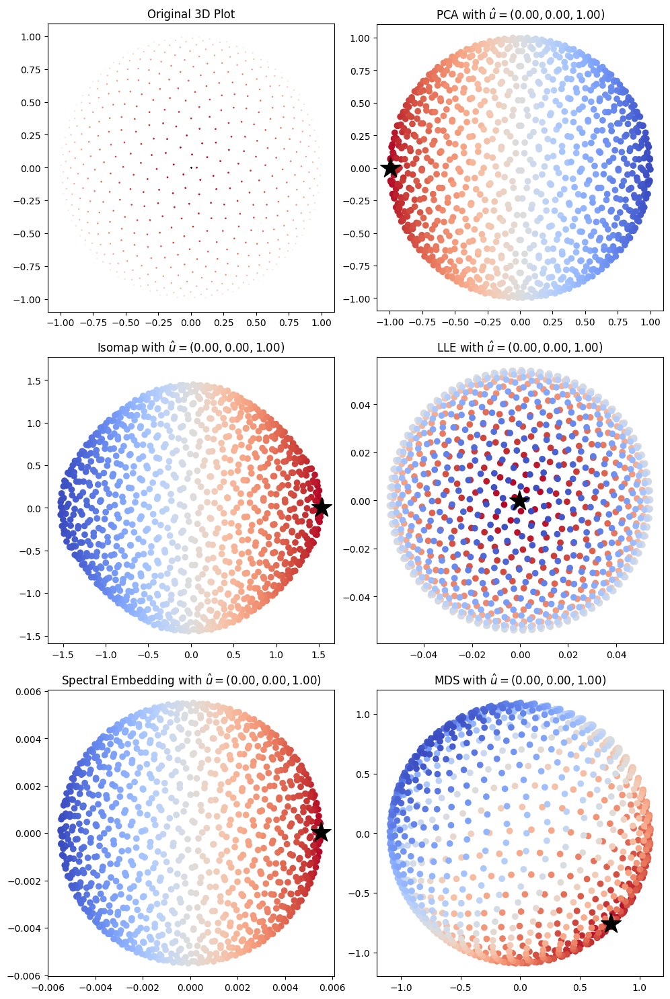

c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


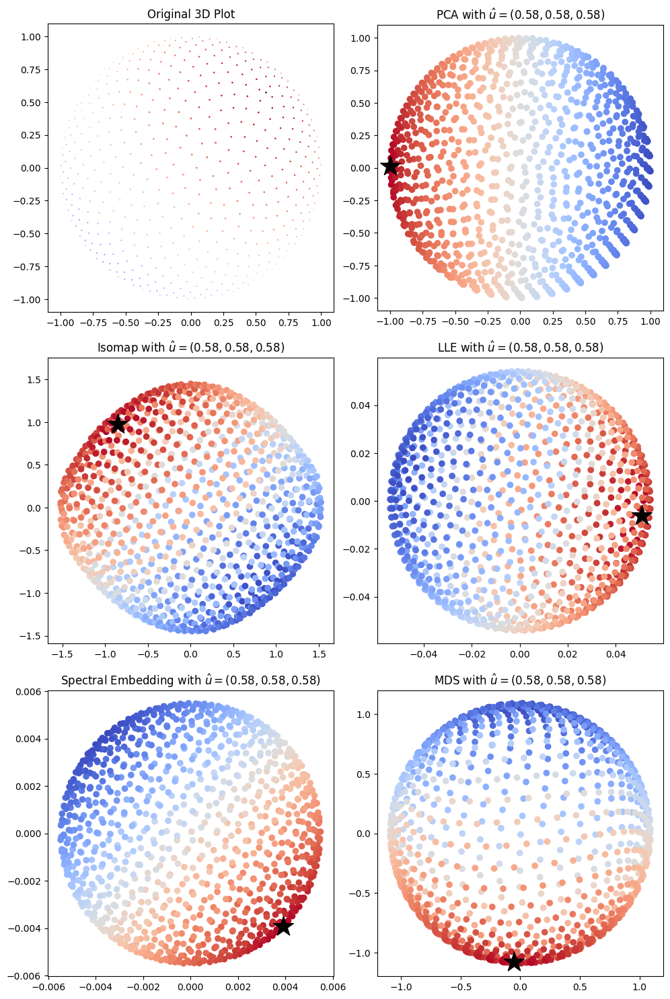

c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


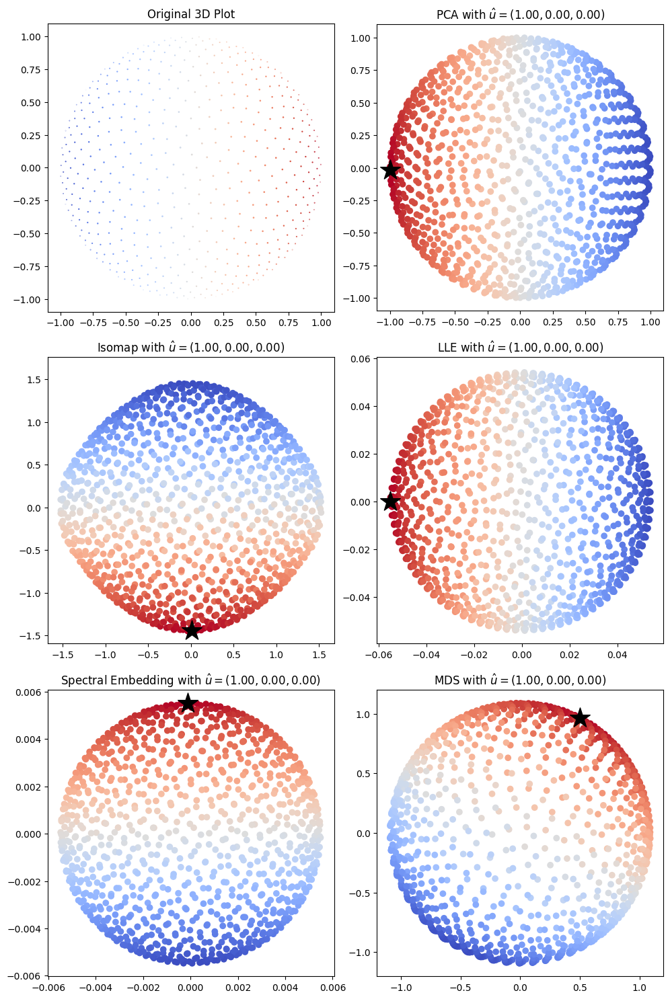

In [228]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np


reductions = {
    'PCA': PCA(n_components=2),
    'Isomap': Isomap(n_components=2),
    'LLE': LocallyLinearEmbedding(n_components=2),
    'Spectral Embedding': SpectralEmbedding(n_components=2),
    'MDS': MDS(n_components=2)
}
us = [
    np.array([0,0,1]),
    1./np.sqrt(3) * np.array([1,1,1]),
    np.array([1,0,0])
]
for u in us:
    dist = cosine_similarity(np.array(u).reshape(1,-1), vectors)
    # Create a figure with subplots
    fig, axs = plt.subplots(3, 2, figsize=(10, 15))

    # Original 3D plot
    axs[0, 0].scatter(vectors[:, 0], vectors[:, 1], vectors[:, 2], c=dist, cmap='coolwarm')
    axs[0, 0].scatter(u[0], u[1], u[2], c='black', marker='*')#, s=500)
    axs[0, 0].set_title('Original 3D Plot')

    for i, (name, reducer) in enumerate(reductions.items()):
        reduced_vectors = reducer.fit_transform(np.vstack((vectors, u)))
        axs[(i+1)//2, (i+1)%2].scatter(reduced_vectors[:-1, 0], reduced_vectors[:-1, 1], c=dist, cmap='coolwarm')
        axs[(i+1)//2, (i+1)%2].scatter(reduced_vectors[-1, 0], reduced_vectors[-1, 1], marker='*', color='k', s=500)
        axs[(i+1)//2, (i+1)%2].set_title(f'{name} with $\\hat{{u}}=({u[0]:.2f}, {u[1]:.2f}, {u[2]:.2f})$')
        axs[(i+1)//2, (i+1)%2].axis('square')

    # Show the plots
    plt.tight_layout()
    plt.show()

(400, 3)


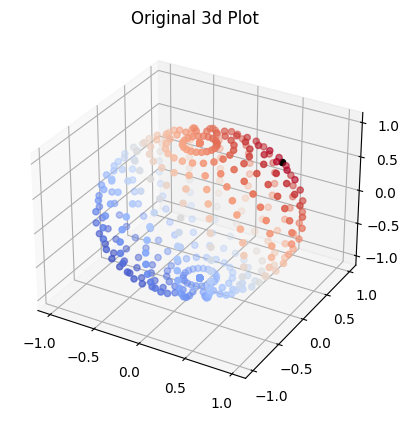

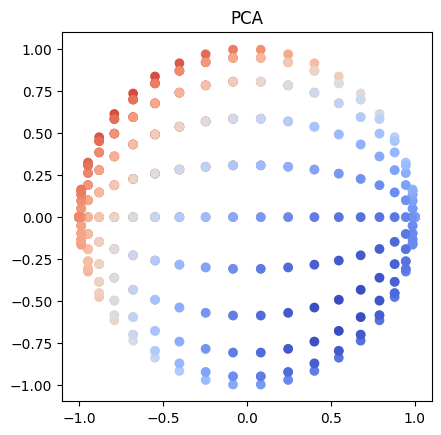

c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\sklearn\manifold\_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 3 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: 

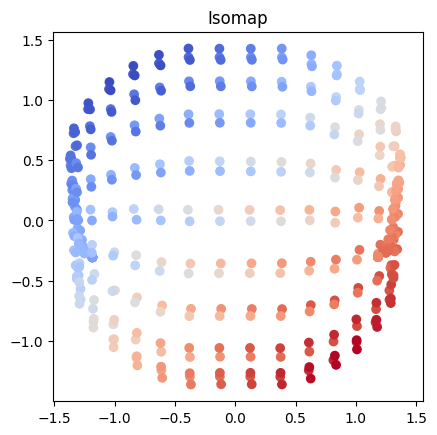

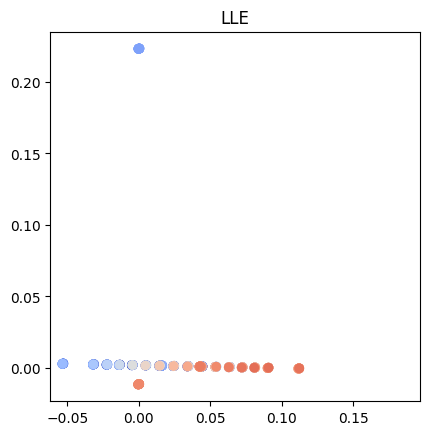

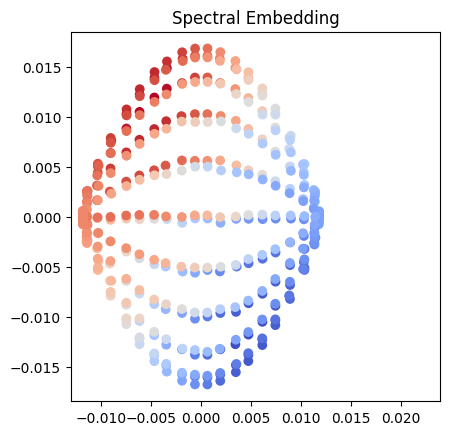

c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


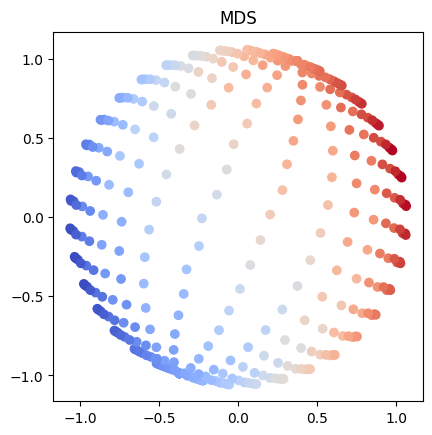

In [182]:
import numpy as np

def generate_uniform_unit_vectors(n):
    # Generate n equally spaced angles
    theta = np.linspace(0, 2 * np.pi, n, endpoint=False)

    # Generate n equally spaced elevation angles (from -pi/2 to pi/2)
    phi = np.linspace(-np.pi / 2, np.pi / 2, n)

    # Create meshgrid of angles
    theta_grid, phi_grid = np.meshgrid(theta, phi)

    # Compute x, y, z coordinates
    x = np.cos(theta_grid) * np.cos(phi_grid)
    y = np.sin(theta_grid) * np.cos(phi_grid)
    z = np.sin(phi_grid)

    # Stack coordinates into a (n, 3) array
    unit_vectors = np.column_stack((x.ravel(), y.ravel(), z.ravel()))

    return unit_vectors

# Example: Generate 10 uniformly spaced unit vectors
n_vectors = 20
u_vecs = generate_uniform_unit_vectors(n_vectors)
print(u_vecs.shape)


u = 1/np.sqrt(3) * np.array([1,1,1])
sim = cosine_similarity(np.array(u).reshape(1,-1), u_vecs)


reductions = {
    'PCA': PCA(n_components=2),
    'Isomap': Isomap(n_components=2),
    'LLE': LocallyLinearEmbedding(n_components=2),
    'Spectral Embedding': SpectralEmbedding(n_components=2),
    'MDS': MDS(n_components=2)
}

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(u_vecs[:,0], u_vecs[:,1], u_vecs[:,2], c=sim, cmap='coolwarm')
# Add the vector u to the plot
ax.scatter(u[0], u[1], u[2], c='black')
plt.title('Original 3d Plot')
plt.show()
#"""
# use pipeline to fit_transform the vectors and plot each
for name, reducer in reductions.items():
    reduced_vectors = reducer.fit_transform(u_vecs) 
    plt.figure()
    plt.scatter(reduced_vectors[:,0], reduced_vectors[:,1], c=sim, cmap='coolwarm')
    plt.title(name)
    plt.axis('square')
    plt.show()

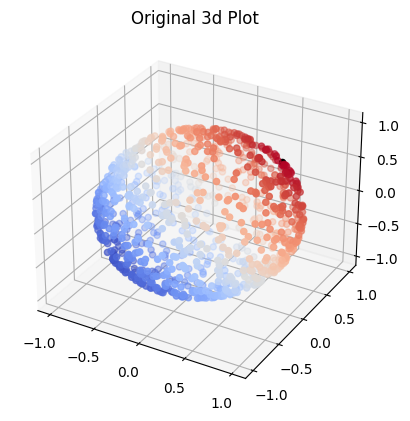

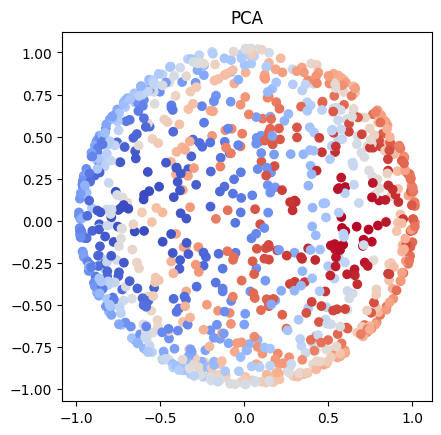

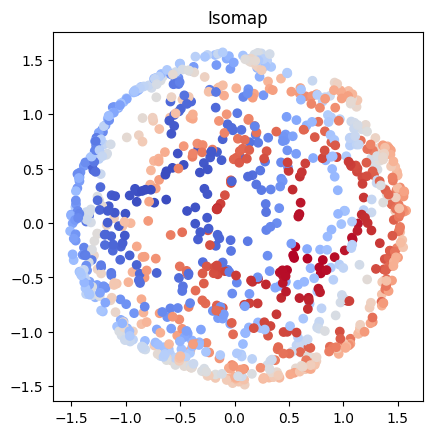

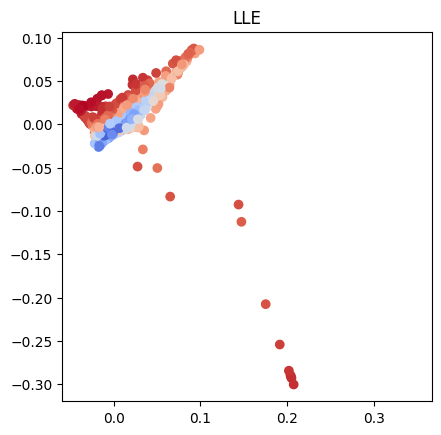

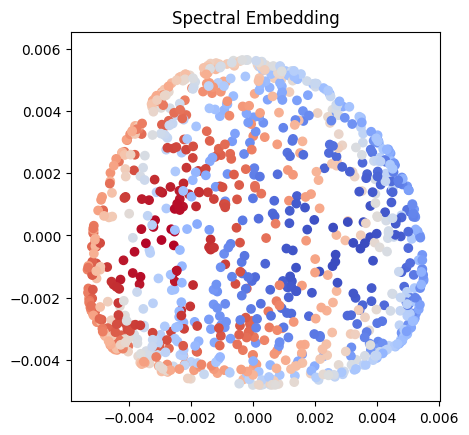

c:\Users\Peter\AppData\Local\Continuum\anaconda3\envs\reddit-rag\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


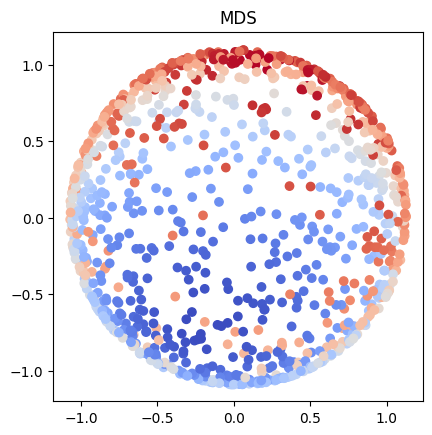

In [172]:
# import pca
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap, LocallyLinearEmbedding, MDS, SpectralEmbedding
from sklearn.metrics.pairwise import cosine_similarity
# Create a 3-d plot of the vectors where the colors are based on location in the unit sphere
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
# Create 1000 uniformly distributed 3-d unit vectors 
import numpy as np
n = 1000
np.random.seed(0)
vectors = np.random.randn(n, 3)
vectors /= np.linalg.norm(vectors, axis=1)[:, np.newaxis]

reductions = {
    'PCA': PCA(n_components=2),
    'Isomap': Isomap(n_components=2),
    'LLE': LocallyLinearEmbedding(n_components=2),
    'Spectral Embedding': SpectralEmbedding(n_components=2),
    'MDS': MDS(n_components=2)
}
u = 1/np.sqrt(3) * np.array([1,1,1])
dist = cosine_similarity(np.array(u).reshape(1,-1), vectors)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(vectors[:,0], vectors[:,1], vectors[:,2], c=dist, cmap='coolwarm')
# Add the vector u to the plot
ax.scatter(u[0], u[1], u[2], c='black')
plt.title('Original 3d Plot')
plt.show()
#"""
# use pipeline to fit_transform the vectors and plot each
for name, reducer in reductions.items():
    reduced_vectors = reducer.fit_transform(vectors) 
    plt.figure()
    plt.scatter(reduced_vectors[:,0], reduced_vectors[:,1], c=dist, cmap='coolwarm')
    plt.title(name)
    plt.axis('square')
    plt.show()
#""" 

In [ ]:

    input_str = 'Label the following statement as describing overstaffing (1), understaffing (-1), or neither (0)'
    input_str += '\nStatement:' + wrap_text(statements[idx], n_words = 15, indent='\t')

In [80]:
x = int(input("Label this statement: "))
x

-1

In [77]:
output_df.label.value_counts()

label
-1    175
 0    148
 1      3
Name: count, dtype: int64

In [68]:
[doc for doc in over if 'too' in doc.page_content]

[Document(page_content='As geeksquad I rerelease take lunch let alone breaks. But I’m definitely seeing the sales floor get hit with the, “ we have too many employees and not enough hours” while at the same time being severely understaffed in everything we do.most sales associates get 10ish hrs per week. Customers wait about 20 min to get helped. And what’s best is when they have geek squad at the register because they need “help” and then yell at us for NPS sucking cause our work didn’t get done.  We all should be looking for new jobs.', metadata={'reddit_id': 'hxz4pag', 'aware_post_type': 'comment', 'aware_created_ts': '2022-02-22T10:48:52', 'reddit_link_id': 't3_sygsv3', 'reddit_parent_id': 't3_sygsv3', 'reddit_permalink': '/r/BestBuyWorkers/comments/sygsv3/rant_time/hxz4pag/', 'reddit_subreddit': 'BestBuyWorkers'}),
 Document(page_content='Ehh I can see them upset at us because we have a more efficient precinct than many I\'ve seen. Our function checks are always between 0-5 as we 

In [60]:
print_labeler_iteration(statements[idx], output)


------------------------------------------------------------

Statement: Absolutely. I had a talk with a leader last week about this, pointing out that we're running a bare minimum 
	 of staff who have to know and do more than ever before while being paid less than we were 
	 just two years ago.
Output:  {
  "label": -1,
  "reason": "The statement describes understaffing because the employee mentions running a bare minimum of 
	 staff who have to know and do more than ever before while being paid less than they were two 
	 years ago. This implies that there is not enough staff to handle the workload efficiently."
}


In [58]:
statements[idx]

"Absolutely. I had a talk with a leader last week about this, pointing out that we're running a bare minimum of staff who have to know and do more than ever before while being paid less than we were just two years ago."

In [57]:
idx = 0
output = labeler.evaluate_one('', statements[idx])
print(output)

{'label': -1, 'reason': 'The statement describes understaffing because the employee mentions running a bare minimum of staff who have to know and do more than ever before while being paid less than they were two years ago. This implies that there is not enough staff to handle the workload efficiently.', 'output': ' {\n  "label": -1,\n  "reason": "The statement describes understaffing because the employee mentions running a bare minimum of staff who have to know and do more than ever before while being paid less than they were two years ago. This implies that there is not enough staff to handle the workload efficiently."\n}'}


In [9]:
len(docs)

5629

In [8]:
len(retriever.documents)

5667

In [10]:
df.reddit_parent_id.value_counts()

reddit_parent_id
t3_18rkcrr    64
t3_15sx2rf    30
t3_tqejhm     29
t3_1aj1kcj    29
t3_15qii74    24
              ..
t1_jt7fhw7     1
t1_jt77ipp     1
t1_jt76y4d     1
t1_jt751f6     1
t1_ktt455y     1
Name: count, Length: 2554, dtype: int64

In [11]:
df.reddit_link_id.value_counts()

reddit_link_id
t3_18rkcrr    99
t3_1b114ek    54
t3_15sx2rf    48
t3_1aj1kcj    47
t3_18ff4a2    47
              ..
t3_zcqnma      1
t3_qp4czc      1
t3_qqysf1      1
t3_16agd8r     1
t3_163516u     1
Name: count, Length: 707, dtype: int64

In [12]:
df.reddit_submission.value_counts()

reddit_submission
18rkcrr    99
1b114ek    54
15sx2rf    48
1aj1kcj    47
18ff4a2    47
           ..
zcqnma      1
qp4czc      1
qqysf1      1
16agd8r     1
163516u     1
Name: count, Length: 707, dtype: int64

In [9]:
df.iloc[2].T

aware_post_type                                                 comment
aware_created_ts                                    2023-04-16T19:55:39
reddit_id                                                       jgjpqmp
reddit_name                                                  t1_jgjpqmp
reddit_created_utc                                           1681689339
reddit_author                                       GSAgentsLivesMatter
reddit_text           bullshit on getting $50 its just a coupon to B...
reddit_permalink      /r/BestBuyWorkers/comments/12opsul/research_st...
reddit_title                                                       None
reddit_url                                                         None
reddit_subreddit                                         BestBuyWorkers
reddit_link_id                                               t3_12opsul
reddit_parent_id                                             t3_12opsul
reddit_submission                                               

In [15]:
df.iloc[0].T

aware_post_type                                              submission
aware_created_ts                                    2023-04-16T17:32:45
reddit_id                                                       12opsul
reddit_name                                                  t3_12opsul
reddit_created_utc                                           1681680765
reddit_author                                          utaustinresearch
reddit_text                                                            
reddit_permalink      /r/BestBuyWorkers/comments/12opsul/research_st...
reddit_title                      Research Study Recruitment - Managers
reddit_url                          https://i.redd.it/nrmkf51rebua1.png
reddit_subreddit                                         BestBuyWorkers
reddit_link_id                                                     None
reddit_parent_id                                                   None
reddit_submission                                               

In [14]:
ret_model_name = 'multi-qa-mpnet-base-dot-v1_50-overlap'
attribute_filename = f'../../data/best_buy/{ret_model_name}.pkl'
embedding_filename = f'../../data/best_buy/{ret_model_name}_embeddings.npy'
ret = load_retriever(attribute_filename, embedding_filename)

In [13]:
ret.split_sentence()

NameError: name 'ret' is not defined

In [9]:
overstaffed_chunks = ret.retrieve('Do employees feel overstaffed?', n=50)
understaffed_chunks = ret.retrieve('Do employees feel understaffed?', n=50)
print(overstaffed_chunks)

[{'response': "Absolutely. I had a talk with a leader last week about this, pointing out that we're running a bare minimum of staff who have to know and do more than ever before while being paid less than we were just two years ago.", 'score': 0.64373904}, {'response': 'Are you an employee?', 'score': 0.62938696}, {'response': 'That’s what happens when they cut staff. Everyone else has to pick up the slack.  It is BS. Warehouse already has enough on their plate', 'score': 0.6273591}, {'response': 'Yea, never the employees tho', 'score': 0.6185316}, {'response': 'Sounds like you have. Horrible manager. No reason they are keeping the counts down and giving your part timers more hours and close to yours.', 'score': 0.6051163}, {'response': "Oh well then that's BS for sure. They can afford to spend more labor but they don't. It puts so much stress on everyone", 'score': 0.60038257}, {'response': "Yes I've seen more and more of this. And 6 employees in my store are actively looking for new 

In [8]:
len(ret.chunks)

5664